In [1]:
import cv2 as cv
import numpy as np
import matplotlib
%matplotlib widget
import matplotlib.pyplot as plt

from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import IPython

In [2]:
filename = '../sample/orig/02-table.png'
img = cv.imread(cv.samples.findFile(filename))
cImage = np.copy(img)

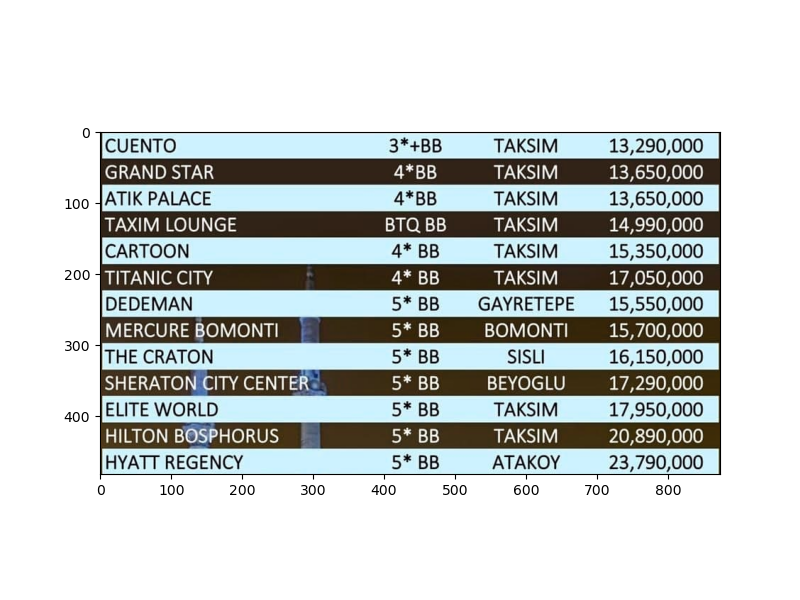

In [3]:
fig = plt.figure(figsize=(8, 6))
plt.imshow(img)

### Parse coordinates if user manually wants to tell us where columns are
1. could be vertical or horizontal
2. could be start or end of row or column

#### Read user input from click
Literally I record a point and save all clicks as list of points to be converted to lines

In [4]:
# reference: https://stackoverflow.com/questions/43396282/cursor-location-and-pixel-value-in-a-jupyter-notebook-inline-image
# Create and display textarea widget
x_coord_textbox = widgets.Textarea(
    value='',
    description='X coord: ',
    disabled=False
)
y_coord_textbox = widgets.Textarea(
    value='',
    description='Y coord: ',
    disabled=False
)
display(x_coord_textbox)
display(y_coord_textbox)

# Define a callback function that will update the textarea
def onclick(event):
    x_coord_textbox.value = f'{str(x_coord_textbox.value)} {str(event.xdata)}'  # Dynamically update the x text box above
    y_coord_textbox.value = f'{str(y_coord_textbox.value)} {str(event.ydata)}'  # Dynamically update the y text box above

# Create an hard reference to the callback not to be cleared by the garbage collector
ka = fig.canvas.mpl_connect('button_press_event', onclick)

Textarea(value='', description='X coord: ')

Textarea(value='', description='Y coord: ')

#### Convert xy coords to lines
Whatever border the point is closest, that direction will be chosen for the line, i.e. if `x < y`, then horizontal, otherwise, vertical.

For conversion to line, each point need to be mapped to start and end point of the line in an `ndarray` of type `int32` in following format:

```[array([x_start, y_start, x_end, y_end]), ...]```

In [5]:
x_coords = x_coord_textbox.value.strip().split(' ')
y_coords = y_coord_textbox.value.strip().split(' ')
coords = [(float(xc), float(yc)) for xc, yc in zip(x_coords, y_coords)]
display(coords)

[(6.640535809916827, 3.089527865658397),
 (363.288922906691, 1.6798504463035897),
 (511.3050519389491, 4.499205285013318),
 (680.4663422615297, 8.728237543077853),
 (858.0856971002394, 3.089527865658397),
 (1.0018261324974844, 475.3314633495293)]

In [6]:
# offset from border
MANUAL_OFFSET = 3
shape = img.shape
manual_lines = []
for x_, y_ in coords:
    # get direction based on the smallest coord
    horizontal = True if x_ < y_ else False
    x_ = np.int32(x_)
    y_ = np.int32(y_)
    if horizontal:
        line = np.array([MANUAL_OFFSET, y_, shape[0], y_])
    else:
        line = np.array([x_,MANUAL_OFFSET, x_, shape[1]])
    manual_lines.append(line)
display(manual_lines)

[array([  6,   3,   6, 874]),
 array([363,   3, 363, 874]),
 array([511,   3, 511, 874]),
 array([680,   3, 680, 874]),
 array([858,   3, 858, 874]),
 array([  3, 475, 482, 475])]

### Edges

#### gray

In [7]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

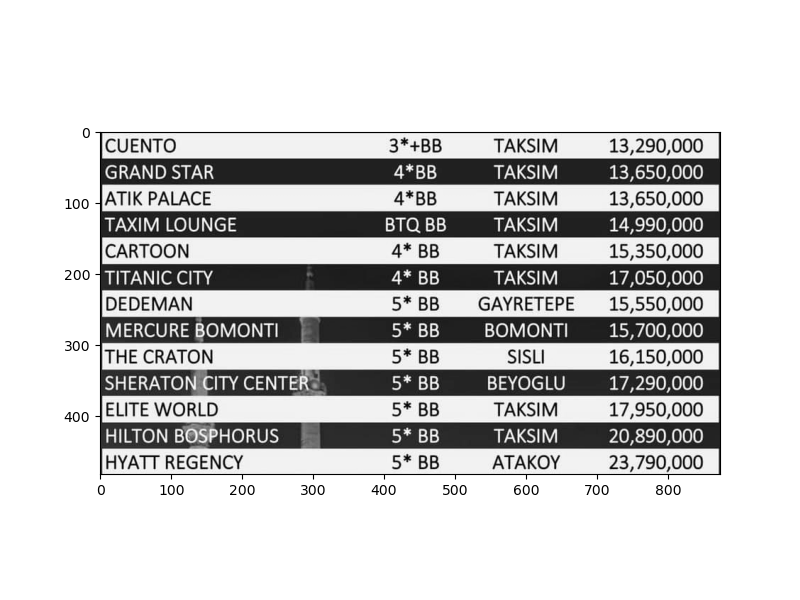

In [8]:
plt.figure(figsize=(8, 6))
plt.imshow(gray, cmap='gray')

#### Canny edge

In [9]:
canny = cv.Canny(gray, 50, 200)

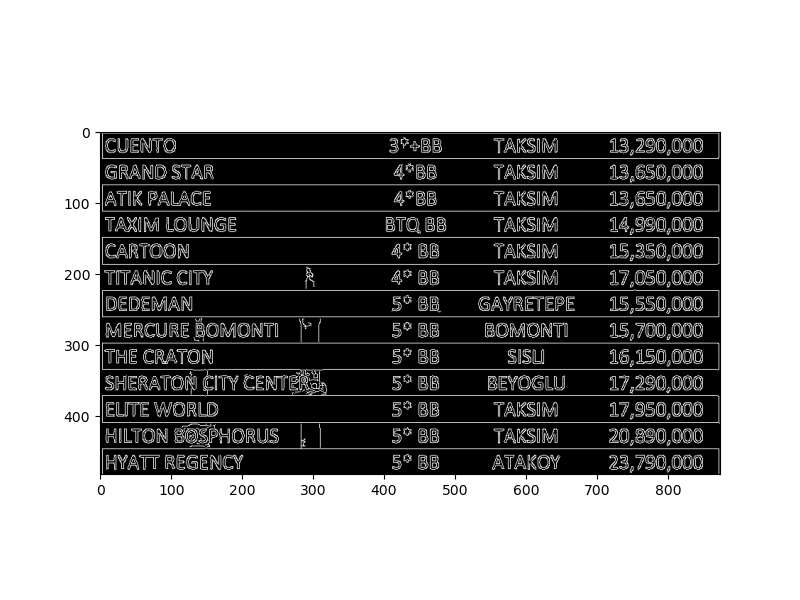

In [10]:
plt.figure(figsize=(8, 6))
plt.imshow(canny, cmap='gray')

### Line Detection

In [11]:
theta = np.pi/180
rho = 1
threshold = 150
minLinLength = 350
maxLineGap = 18
linesP = cv.HoughLinesP(canny, rho, theta, threshold, None, minLinLength, maxLineGap)

In [12]:
def is_vertical(line):
    return line[0]==line[2]
def is_horizontal(line):
    return line[1]==line[3]

horizontal_lines = []
vertical_lines = []

if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        if (is_vertical(l)):
            vertical_lines.append(l)        
        elif (is_horizontal(l)):
            horizontal_lines.append(l)
# append manual lines to auto detected lines
if len(manual_lines) >= 1:
    for i in range(0, len(manual_lines)):
        l = manual_lines[i]
        if (is_vertical(l)):
            vertical_lines.append(l)        
        elif (is_horizontal(l)):
            horizontal_lines.append(l)

for i, line in enumerate(horizontal_lines):
    cv.line(cImage, (line[0], line[1]), (line[2], line[3]), (0,255,0), 3, cv.LINE_AA)
                      
for i, line in enumerate(vertical_lines):
    cv.line(cImage, (line[0], line[1]), (line[2], line[3]), (0,0,255), 3, cv.LINE_AA)

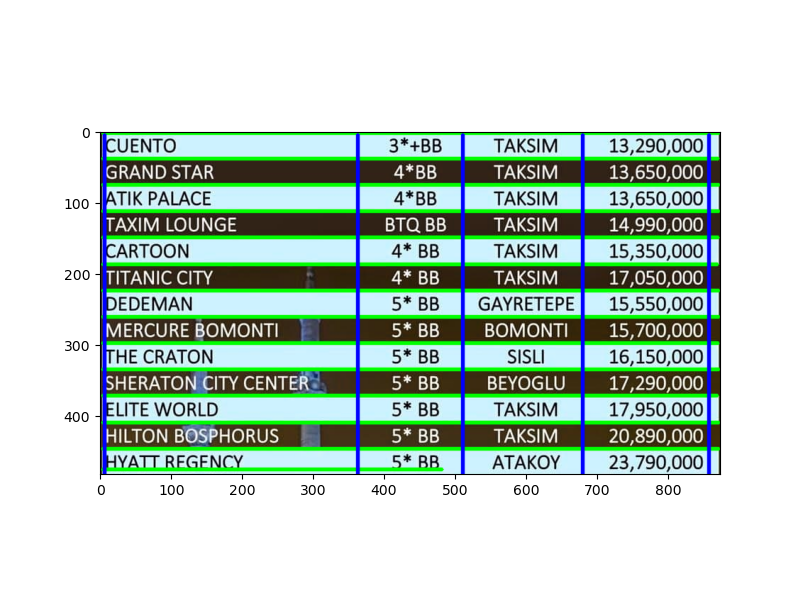

In [13]:
plt.figure(figsize=(8, 6))
plt.imshow(cImage)

In [14]:
def overlapping_filter(lines, sorting_index):
    filtered_lines = []
    
    lines = sorted(lines, key=lambda lines: lines[sorting_index])
    separation = 5
    
    for i in range(len(lines)):
            l_curr = lines[i]
            if(i>0):
                l_prev = lines[i-1]
                if ( (l_curr[sorting_index] - l_prev[sorting_index]) > separation):
                    filtered_lines.append(l_curr)
            else:
                filtered_lines.append(l_curr)
                
    return filtered_lines

In [15]:
vertical_lines = overlapping_filter(vertical_lines, 0)
horizontal_lines = overlapping_filter(horizontal_lines, 1)

for i, line in enumerate(horizontal_lines):
    cv.line(cImage, (line[0], line[1]), (line[2], line[3]), (0,255,0), 3, cv.LINE_AA)
    cv.putText(cImage, str(i) + "h", (line[0] + 5, line[1]), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, cv.LINE_AA)
for i, line in enumerate(vertical_lines):
    cv.line(cImage, (line[0], line[1]), (line[2], line[3]), (0,0,255), 3, cv.LINE_AA)
    cv.putText(cImage, str(i) + "v", (line[0], line[1] + 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, cv.LINE_AA)

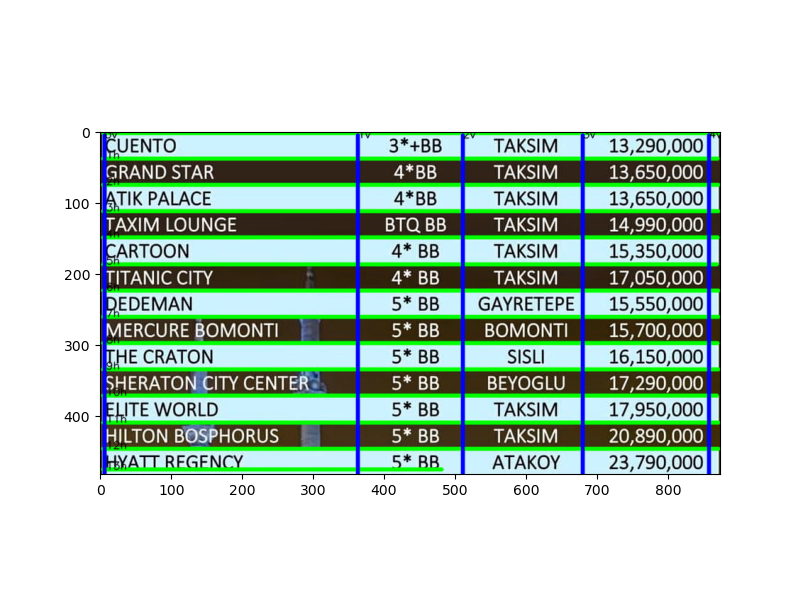

In [16]:
plt.figure(figsize=(8, 6))
plt.imshow(cImage)

### ROI Selection

In [31]:
## set counter for image indexing
counter = 0
    
## set line index
first_line_index = 0
last_line_index = 13

## columns
num_columns = 4

In [32]:
def get_cropped_image(image, x, y, w, h):
    cropped_image = image[ y:y+h , x:x+w ]
    return cropped_image

def get_ROI(image, horizontal, vertical, left_line_index, right_line_index, top_line_index, bottom_line_index, offset=4):
    x1 = vertical[left_line_index][2] + offset
    y1 = horizontal[top_line_index][3] + offset
    x2 = vertical[right_line_index][2] - offset
    y2 = horizontal[bottom_line_index][3] - offset    
    w = x2 - x1
    h = y2 - y1
    
    cropped_image = get_cropped_image(image, x1, y1, w, h)
    
    return cropped_image, (x1, y1, w, h)

### Text Extraction

In [33]:
import pytesseract


def draw_text(src, x, y, w, h, text):
    cFrame = np.copy(src)
    cv.rectangle(cFrame, (x, y), (x+w, y+h), (255, 0, 0), 2)
    cv.putText(cFrame, "text: " + text, (50, 50), cv.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 5, cv.LINE_AA)
    return cFrame

def detect(cropped_frame):
    text = pytesseract.image_to_string(cropped_frame,
        # config='--dpi 600 -l eng+fas --psm 10 --oem 3')
        config='--dpi 100 -l eng+fas')
    return text

Start detecting text...


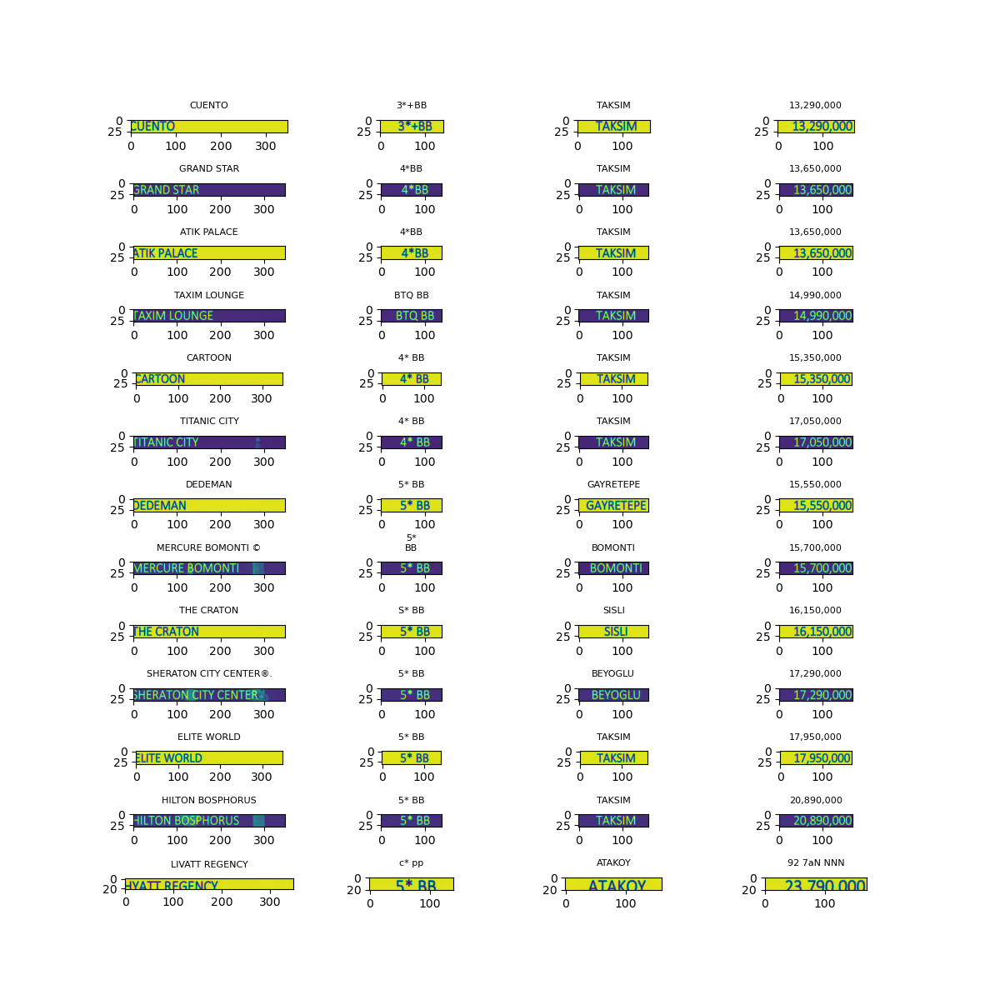

In [ ]:
counter = 0
result_gif = []

fig2 = plt.figure(figsize=(12, 12))
print("Start detecting text...")
USE_BINARY = False  # gray is way better if background is image
image = gray
if USE_BINARY_BINARY:
    (thresh, bw) = cv.threshold(gray, 50, 255, cv.THRESH_BINARY)
    image = bw
for i in range(first_line_index, last_line_index):
    for j in range(num_columns):
        counter += 1
            
        left_line_index = j
        right_line_index = j+1
        top_line_index = i
        bottom_line_index = i+1
            
        cropped_image, (x,y,w,h) = get_ROI(gray,
                                           horizontal_lines,
                                           vertical_lines,
                                           left_line_index,
                                           right_line_index,
                                           top_line_index,
                                           bottom_line_index)
        text = detect(cropped_image)
        image_with_text = draw_text(img, x, y, w, h, text)
        result_gif.append(image_with_text)
        
        # plot each crop
        ax = fig2.add_subplot(last_line_index - first_line_index, num_columns, counter)
        plt.subplots_adjust(hspace=4)
        ax.set_facecolor('k')
        plt.imshow(cropped_image)
        plt.title(text, fontdict={'fontsize':8, 'verticalalignment': 'center'}, )
plt.show()

In [44]:
# show gif out of images
import imageio
imageio.mimsave('result.gif', result_gif, duration=0.2)

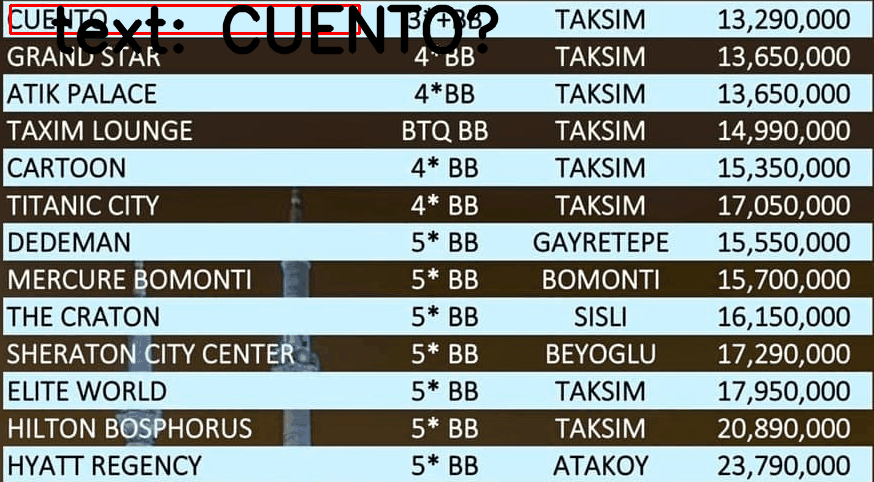

In [45]:
from IPython.display import Image
Image(filename="result.gif")